<a href="https://colab.research.google.com/github/econdatatech/AIML425/blob/main/AIML425_Assignment_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # AIML 425 Assignement 1 
Corvin Idler - ID 300598312

#Preparation
First I import all libraries I need, set all the needed random seeds and check what version of Pytorch and hardware I have been given by Google Colab.
A lot of the code in this and the following section was heavily inspired by the following tutorial: https://colab.research.google.com/github/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial2/Introduction_to_PyTorch.ipynb

In [179]:
## Import Standard libraries
import os
import math
import numpy as np 
import time

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgba
plt.rcParams['figure.figsize'] = [15, 5]

#Import Torch stuff for data generation
import torch
from  torch.distributions.multivariate_normal import MultivariateNormal
import torch.utils.data as data
from torch.utils.data import random_split
!pip install torchmetrics --quiet
from torchmetrics.functional import mean_squared_error

#Import Torch stuff for estimation and evaluation
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook import tqdm

# Import tensorboard logger from PyTorch
from tensorboard import summary
from torch.utils.tensorboard import SummaryWriter
from tensorboard.plugins.custom_scalar import layout_pb2
from tensorboard.plugins.custom_scalar import summary as cs_summary

# Load tensorboard extension for Jupyter Notebook, only need to start TB in the notebook
%load_ext tensorboard

#Take care of randoms seeds at various places to ensure reproducability
# GPU operations have a separate seed we also want to set
torch.manual_seed(42) # Setting the seed

if torch.cuda.is_available(): 
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)

# Additionally, some operations on a GPU are implemented stochastic for efficiency
# We want to ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

#Check PyTorch version and CUDA hardware from Google Colabs
print("Using torch", torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Device", device)
!nvidia-smi

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Using torch 1.11.0+cu113
Device cpu
NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



# Data generation and visualisation
I decided to do it as much as possible in PyTorch as a training exercise. Numpy is obviously straight forward.

In [180]:
#Define my own PyTorch dataset class incl. the data generating functions inside

class Gauss2UnitCircleDataset(data.Dataset):

    def __init__(self, size):
        """
        Inputs:
            size - Number of data points we want to generate
        """
        super().__init__()
        self.size = size
        self.generate_3D_Gauss2UnitCircle()

    def generate_3D_Gauss2UnitCircle(self):
        #Define a generator of the MultiVariate Normal distribution type and an initialize it with 
        #zero means and simple covariance matrix (only ones on the diagonal and rest zeros) 
        distrib = MultivariateNormal(loc=torch.zeros(3), covariance_matrix=torch.eye(3))
        #sample from the generator with as many samples as the input parameter was
        X=distrib.sample((self.size,))

        # generate the points on the unit sphere by normalizing the length of generated point vectors to 1 (radius on unit vector is also 1)
        #torch.linalg.norm is the same as v / np.sqrt(np.sum(v**2)) if v is the 3D vector of the generated points
        #In general form: if p is a point from the 3D Gaussian, then x = s + r*(p-s)/(norm(p-s)) 
        #is the projection of the point p onto a sphere with centre s and radius r
        #as r=1 and s = (0,0,0) in our case, the expression simplifies to x = (p)/norm(p)
        y = X.div(torch.linalg.norm(X,dim=1).reshape((self.size,1)))
        self.X = X
        self.y = y

    def __len__(self):
        # Number of data point we have. Alternatively self.data.shape[0], or self.label.shape[0]
        return self.size

    def __getitem__(self, idx):
        X = self.X[idx]
        y = self.y[idx]
        return X, y

# Generate training dataset 
dataset = Gauss2UnitCircleDataset(size=10000)

In [181]:
dataset_size=len(dataset)
dataset_indices = list(range(dataset_size))
np.random.shuffle(dataset_indices)

train_split_index = int(np.floor(0.70 * dataset_size))
val_split_index = train_split_index+int(np.floor(0.15 * dataset_size))

train_idx, val_idx, test_idx  = dataset_indices[:train_split_index], dataset_indices[train_split_index:val_split_index],dataset_indices[val_split_index:]

#need to drop the last batch in training data set if it's less than batch_size to ensure consisten batch sizes
train_data_loader = data.DataLoader(dataset, batch_size=len(train_idx),drop_last=True,shuffle=False,sampler=data.SubsetRandomSampler(train_idx))
#don't need to drop anything during evaluation though
validation_data_loader = data.DataLoader(dataset, batch_size=len(val_idx),drop_last=False,shuffle=False,sampler=data.SubsetRandomSampler(val_idx))
test_data_loader = data.DataLoader(dataset, batch_size=len(test_idx),drop_last=False,shuffle=False,sampler=data.SubsetRandomSampler(test_idx))


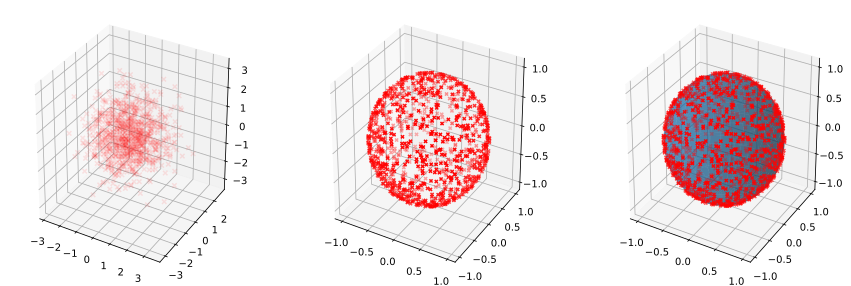

In [182]:
#Visualisation part
N=15 #number of strides to draw the sphere
n_vis_sample =1000
up, vp = np.mgrid[0:2 * np.pi:30j, 0:np.pi:20j]
x = np.cos(up) * np.sin(vp)
y = np.sin(up) * np.sin(vp)
z = np.cos(vp)

fig, ax = plt.subplots(1, 3, subplot_kw={'projection':'3d'})

vizX=dataset.X.detach().cpu().numpy()[train_idx[:n_vis_sample]]
vizY=dataset.y.detach().cpu().numpy()[train_idx[:n_vis_sample]]


#for plotting 
ax[0].scatter(vizX[:,0],vizX[:,1],vizX[:,2],alpha=0.1, marker='x',c='r')
ax[1].scatter(vizY[:,0],vizY[:,1],vizY[:,2], s=10, c='r',marker='x')
ax[2].plot_surface(x, y, z, linewidth=0.0, alpha=0.5)
ax[2].scatter(vizY[:,0],vizY[:,1],vizY[:,2], s=10, c='r',marker='x')

fig.savefig('train_data_plot.svg')

In [183]:
#Define my neural network class / model as per the assignement architecture specs
class SimpleRegression(nn.Module):

    def __init__(self):
        super().__init__()
        self.hidden1 = nn.Linear(3, 12)
        self.hidden2 = nn.Linear(12, 12)
        self.output = nn.Linear(12, 3)


    def forward(self, x):
        # Perform the calculation of the model to determine the prediction
        x = F.relu(self.hidden1(x))
        x = F.relu(self.hidden2(x))
        x = self.output(x)
        
        return x 

In [184]:
#Instantiate the model
model = SimpleRegression()
#Push the model to the GPU if one exists
model.to(device)

SimpleRegression(
  (hidden1): Linear(in_features=3, out_features=12, bias=True)
  (hidden2): Linear(in_features=12, out_features=12, bias=True)
  (output): Linear(in_features=12, out_features=3, bias=True)
)

In [185]:
#Check how many free parameters we have, to gauge if the number of training instances 
#is sufficient
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        params = parameter.numel()
        table.add_row([name, params])
        total_params+=params
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params
    
count_parameters(model)


+----------------+------------+
|    Modules     | Parameters |
+----------------+------------+
| hidden1.weight |     36     |
|  hidden1.bias  |     12     |
| hidden2.weight |    144     |
|  hidden2.bias  |     12     |
| output.weight  |     36     |
|  output.bias   |     3      |
+----------------+------------+
Total Trainable Params: 243


243

In [186]:
#Define the optimizer function and loss function
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)
loss_module = torch.nn.MSELoss()

In [187]:
# Define as simple training method for a quick training
# for my experiments and logging of results I will use a more 
# sophisticated function further down in my notebook
def train_model(model, optimizer, data_loader, loss_module, num_epochs=100):
    # Set model to train mode
    model.train() 
    
    # Training loop
    for epoch in tqdm(range(num_epochs)):
        for X, y in data_loader:
            
            ## Step 1: Move input data to device (only strictly necessary if we use GPU)
            X = X.to(device)
            y = y.to(device)
            
            ## Step 2: Run the model on the input data
            preds = model(X)
            preds = preds.squeeze(dim=1) # Output is [Batch size, 1], but we want [Batch size]
            
            ## Step 3: Calculate the loss
            loss = loss_module(preds, y)
            
            ## Step 4: Perform backpropagation
            # Before calculating the gradients, we need to ensure that they are all zero. 
            # The gradients would not be overwritten, but actually added to the existing ones.
            optimizer.zero_grad() 
            # Perform backpropagation
            loss.backward()
            
            ## Step 5: Update the parameters
            optimizer.step()

In [188]:
#and now the fun part... train the model by pulling everything together
# take a low number of epochs. Just want to test if it works in principle
train_model(model, optimizer, train_data_loader, loss_module)

  0%|          | 0/100 [00:00<?, ?it/s]

In [189]:
#save the model for later if ever we need it again
state_dict = model.state_dict()
# torch.save(object, filename). For the filename, any extension can be used
torch.save(state_dict, "our_model.tar")

In [190]:
#Just placeholder code if ever we want to load the model again
# Load state dict from the disk (make sure it is the same name as above)
#state_dict = torch.load("our_model.tar")

# Create a new model and load the state
#model = SimpleClassifier()
#model.load_state_dict(state_dict)

In [191]:
#Define the evaluation methods
def eval_model(model, data_loader):
    model.eval() # Set model to eval mode
    sq_error = 0.
    
    with torch.no_grad(): # Deactivate gradients for the following code
        for X, y in data_loader:
            
            # Determine prediction of model
            X, y = X.to(device), y.to(device)
            preds = model(X)
            preds = preds.squeeze(dim=1)
            
            # Calculate the loss with MSE. The M(ean) in this is across 
            # the instances of a mini batch.
            # So an overall MSE can only be calculated as an average across mini-batches
            # so basically a mean-MSE. That means I need to weigh each MSE with the batch size
            # which might vary in the evaluation mode as same batch size isn't enforced 
            # by the data loader for val and test.
            # currently the rest of the code in this notebook makes all data part of a batch
            # so the MSE is THE MSE
            sq_error += torch.nn.functional.mse_loss(preds,y)*y.shape[0]

            
    return (sq_error/len(data_loader.sampler))


In [192]:
#quick check of the test performance of the model
#more elaborated testing will happen further down in the notebook
eval_model(model, test_data_loader)

tensor(0.0863)

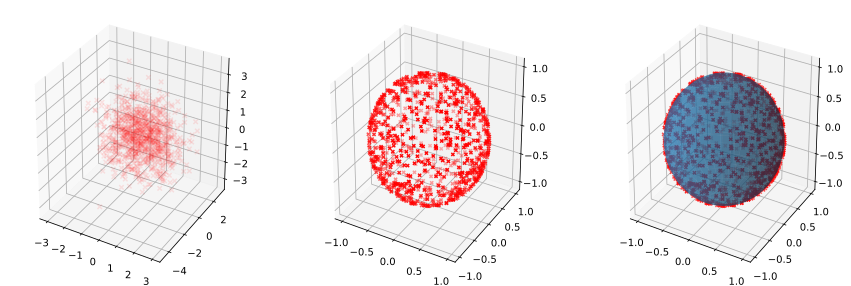

In [193]:
# quick plot of the validation results to make sure everything works (which it does)
vizX=dataset.X.detach().cpu().numpy()[val_idx[:n_vis_sample]]
vizY=dataset.y.detach().cpu().numpy()[val_idx[:n_vis_sample]]


fig, ax = plt.subplots(1, 3, subplot_kw={'projection':'3d'})


#for plotting 
ax[0].scatter(vizX[:,0],vizX[:,1],vizX[:,2],alpha=0.1, marker='x',c='r')
ax[1].scatter(vizY[:,0],vizY[:,1],vizY[:,2], s=10, c='r',marker='x')
ax[2].plot_surface(x, y, z, linewidth=0.0, alpha=0.5)
ax[2].scatter(vizY[:,0],vizY[:,1],vizY[:,2], s=10, c='r',marker='x')


In [194]:
@torch.no_grad() # Decorator, same effect as "with torch.no_grad(): ..." over the whole function.
def visualize_regression(model, data_loader):
    prediction_list = []
    
    model.eval() # Set model to eval mode
    
    with torch.no_grad(): # Deactivate gradients for the following code
        for X, y in data_loader:
          X=X.to(device)
          preds = model(X)
          preds = preds.squeeze(dim=1)
          prediction_list.append(preds.detach().cpu())
    fig, ax = plt.subplots(1, 1, subplot_kw={'projection':'3d'})
    res=np.concatenate(prediction_list).ravel().reshape(-1,3)
    ax.scatter(res[:,0],res[:,1],res[:,2], s=10, c='r',marker='x')
    return fig

In [202]:
@torch.no_grad() # Decorator, same effect as "with torch.no_grad(): ..." over the whole function.
def visualize_histo(model, data_loader):
    prediction_list = []
    X_list = []

    model.eval() # Set model to eval mode
    
    with torch.no_grad(): # Deactivate gradients for the following code
        for X, y in data_loader:
            # Determine prediction of model
            X, y = X.to(device), y.to(device)
            preds = model(X)
            preds = preds.squeeze(dim=1)
            
            prediction_list.append(preds.detach().cpu())
            X_list.append(X)
    fig, ax = plt.subplots(1, 1)
    res=np.linalg.norm(np.concatenate(prediction_list).ravel().reshape(-1,3),axis=1) 
    resx=np.linalg.norm(np.concatenate(X_list).ravel().reshape(-1,3),axis=1) 
    ax.hist(res, bins='auto',alpha=0.5)  # arguments are passed to np.histogram
    ax.hist(resx, bins='auto',alpha=0.5)  # arguments are passed to np.histogram

    return fig



In [195]:
def train_model_with_logger(model, optimizer, data_loader, loss_module, val_data_loader, num_epochs=100, logging_dir='runs/our_experiment'):
    # Create TensorBoard logger
 
    train_writer = SummaryWriter(os.path.join(logging_dir, "train"))
    val_writer = SummaryWriter(os.path.join(logging_dir, "val"))

    model_plotted = False
    
    # Set model to train mode
    model.train() 
    
    # Training loop
    for epoch in tqdm(range(num_epochs)):
        epoch_loss = 0.0
        for X, y in data_loader:
            
            ## Step 1: Move input data to device (only strictly necessary if we use GPU)
            X = X.to(device)
            y = y.to(device)
            
            # For the very first batch, we visualize the computation graph in TensorBoard
            if not model_plotted:
                train_writer.add_graph(model, X)
                model_plotted = True
            
            ## Step 2: Run the model on the input data
            preds = model(X)
            preds = preds.squeeze(dim=1) # Output is [Batch size, 1], but we want [Batch size]
            
            ## Step 3: Calculate the loss
            loss = loss_module(preds, y)
            
            ## Step 4: Perform backpropagation
            # Before calculating the gradients, we need to ensure that they are all zero. 
            # The gradients would not be overwritten, but actually added to the existing ones.
            optimizer.zero_grad() 
            # Perform backpropagation
            loss.backward()
            
            ## Step 5: Update the parameters
            optimizer.step()
            
            ## Step 6: Take the running average of the loss
            epoch_loss += loss.item()* y.shape[0]
            
        # Add average loss to TensorBoard
        epoch_loss /= len(train_data_loader.sampler)
        
        # writing to the file system and running the evaluation on the 
        # validation set and generating graphs costs heaps of time
        # so I only do it every 50 epochs
        if (epoch + 1) % 50 == 0:

            train_writer.add_scalar('loss',
                              epoch_loss,
                              global_step = epoch + 1)

            val_epoch_loss=eval_model(model, val_data_loader)
            val_writer.add_scalar('loss',
                              val_epoch_loss,
                              global_step = epoch + 1)
            # Visualize prediction and add figure to TensorBoard
            fig = visualize_regression(model, val_data_loader)
            fighist=visualize_histo(model, val_data_loader)
            train_writer.add_figure('predictions', fig, global_step = epoch + 1)
            train_writer.add_figure('error histogram', fighist, global_step = epoch + 1)

    train_writer.close()
    val_writer.close()

In [196]:
train_model_with_logger(model, optimizer, train_data_loader, loss_module, val_data_loader=validation_data_loader, num_epochs=5000)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [197]:
%tensorboard --logdir runs/our_experiment --samples_per_plugin images=100

Reusing TensorBoard on port 6006 (pid 319), started 2:04:18 ago. (Use '!kill 319' to kill it.)

<IPython.core.display.Javascript object>